In [0]:
from google.colab import drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import math


In [0]:
train = pd.read_csv('/content/drive/My Drive/DSF_HW3_Datasets/train.csv')
test = pd.read_csv('/content/drive/My Drive/DSF_HW3_Datasets/test.csv')
sample_submission = pd.read_csv('/content/drive/My Drive/DSF_HW3_Datasets/sample_submission.csv')

**Columns of Data are -**

In [0]:
print(list(train.columns))

['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC'

# Part 1 - Pairwise Correlations

---



Select a set of 10-15 of the most interesting variables.  Do a pairwise Pearson correlation analysis on all pairs of these variables. Show the result with heat map and find out most positive and negative correlations. You can use the seaborn library to plot the heatmap, with instructions found here

Let's see the correlation of all variables


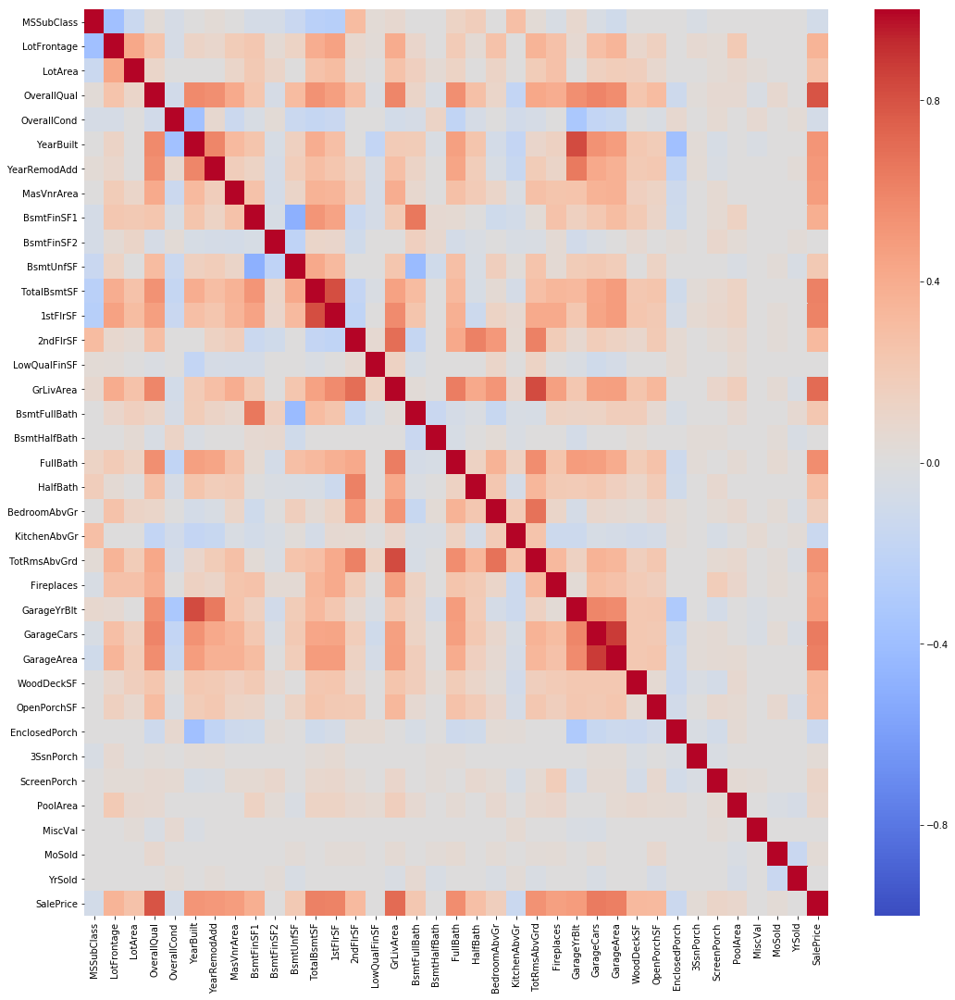

In [0]:
'''Lets see the correlation of all variables'''
subjective_corr = train.loc[:, train.columns != 'Id'].corr()
subjective_corr[np.abs(subjective_corr)<.03] = 0
plt.figure(figsize=(18,18))
sns.heatmap(subjective_corr,
           vmin=-1,
           vmax=1,
           cmap='coolwarm',
           annot=False);

In [0]:
correlation_matrix = train.loc[:, train.columns != 'Id'].corr()
mask = np.triu(np.ones_like(correlation_matrix),1) == 1
correlation_matrix = correlation_matrix.where(mask).stack()

In [0]:
'''Get Top 10 Positive Correlations'''
top10PositiveCorrelations = correlation_matrix.nlargest(10)

'''Get Bottom 10 Positive Correlations'''
bottom10PositiveCorrelations = correlation_matrix[correlation_matrix > 0].nsmallest(10)

'''Get Top 10 Negative Correlations'''
top10NegativeCorrelations = correlation_matrix[correlation_matrix < 0].nsmallest(10)

'''Get Bottom 10 Negative Correlations'''
bottom10NegativeCorrelations = correlation_matrix[correlation_matrix < 0].nlargest(10)

print("Top 10 Positive Correlations are -  ")
print("\n")
print(top10PositiveCorrelations)
print("\n")

print("Bottom 10 Positive Correlations are -  ")
print("\n")
print(bottom10PositiveCorrelations)
print("\n")

print("Top 10 Negative Correlations are -  ")
print("\n")
print(top10NegativeCorrelations)
print("\n")

print("Bottom 10 Negative Correlations are - ")
print("\n")
print(bottom10NegativeCorrelations)
print("\n")

Top 10 Positive Correlations are -  


GarageCars    GarageArea      0.882475
YearBuilt     GarageYrBlt     0.825667
GrLivArea     TotRmsAbvGrd    0.825489
TotalBsmtSF   1stFlrSF        0.819530
OverallQual   SalePrice       0.790982
GrLivArea     SalePrice       0.708624
2ndFlrSF      GrLivArea       0.687501
BedroomAbvGr  TotRmsAbvGrd    0.676620
BsmtFinSF1    BsmtFullBath    0.649212
YearRemodAdd  GarageYrBlt     0.642277
dtype: float64


Bottom 10 Positive Correlations are -  


3SsnPorch     MiscVal          0.000354
LotArea       MoSold           0.001205
HalfBath      MiscVal          0.001290
Fireplaces    MiscVal          0.001409
1stFlrSF      BsmtHalfBath     0.001956
BsmtFinSF2    OpenPorchSF      0.003093
LotFrontage   MiscVal          0.003368
MSSubClass    BsmtFullBath     0.003491
BsmtFinSF1    MiscVal          0.003571
TotRmsAbvGrd  EnclosedPorch    0.004151
dtype: float64


Top 10 Negative Correlations are -  


BsmtFinSF1   BsmtUnfSF       -0.495251
BsmtUnfSF    Bsmt

From this, we see the most important variables are - **BsmtFinSF1, BsmtUnfSF, BsmtFullBath, YearBuilt, EnclosedPorch, MSSubClass, LotFrontage, OverallCond, GarageYrBlt, EnclosedPorch, 1stFlrSF, TotalBsmtSF, BsmtFinSF2, BsmtUnfSF**. Let's plot a Pearson Correlation Matix w.r.t these


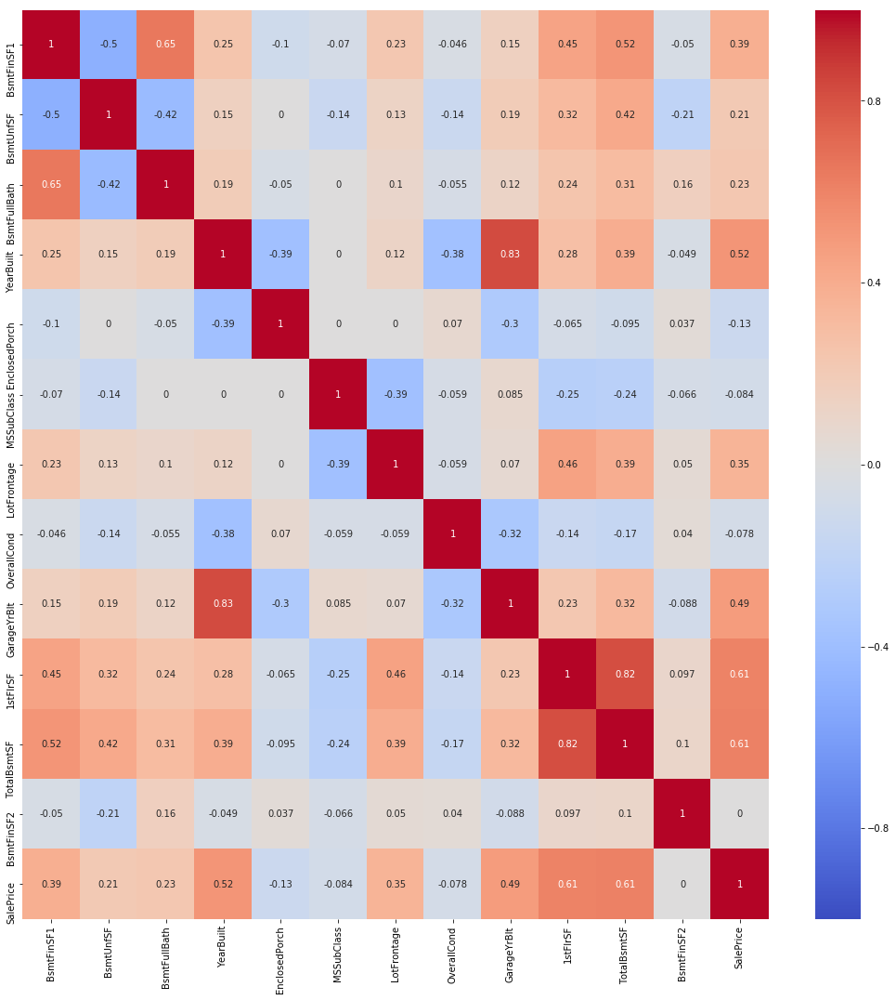

In [0]:
interesting_columns = ['BsmtFinSF1', 'BsmtUnfSF', 'BsmtFullBath', 
                       'YearBuilt', 'EnclosedPorch', 'MSSubClass', 
                       'LotFrontage', 'OverallCond', 'GarageYrBlt'
                       , '1stFlrSF', 'TotalBsmtSF', 'BsmtFinSF2','SalePrice']
train_interesting_variables = train[interesting_columns]

subjective_corr = train_interesting_variables.corr()
subjective_corr[np.abs(subjective_corr)<.03] = 0
plt.figure(figsize=(18,18))
sns.heatmap(subjective_corr,
           vmin=-1,
           vmax=1,
           cmap='coolwarm',
           annot=True);

# Part 2 - Informative Plots


Produce five other informative plots revealing aspects of this data. For each plot, write a paragraph in your notebook describing what interesting properties your visualization reveals. These must include:
* at least one line chart
* at least one scatter plot or data map
* at least one histogram or bar chart


Let's see the scatter plots of all columns with float values against Sale Price. But first, let's get the columns based on dtypes

In [0]:
'''Cite - https://stackoverflow.com/questions/22470690/get-list-of-pandas-dataframe-columns-based-on-data-type'''

x = train.columns.to_series().groupby(train.dtypes).groups
column_types_and_names = {k.name: v for k, v in x.items()}
print("Columns grouped by their dytpes - \n")
print(column_types_and_names)

Columns grouped by their dytpes - 

{'int64': Index(['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object'), 'float64': Index(['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], dtype='object'), 'object': Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'Bsmt

Let's plot a scatter plot for each of columns of float64 type against SalePrice

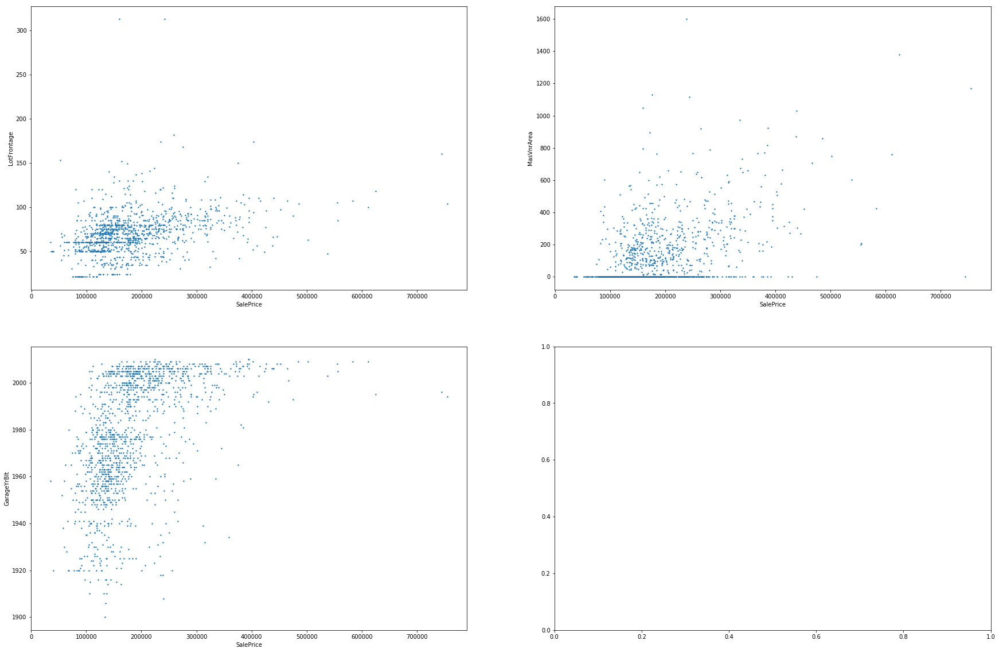

In [0]:
fig,ax1 = plt.subplots(math.ceil(len(column_types_and_names["float64"])/2),2)

for index in range(0,len(column_types_and_names["float64"])):
  train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["float64"][index], ax=ax1[int(index / 2)][index % 2],figsize = (30,20), s = 2);
plt.show()

Let's see a Bar Chart showing the distribution of TotalRmsAbvGrd - showing the distribution of counts and the average price of the house

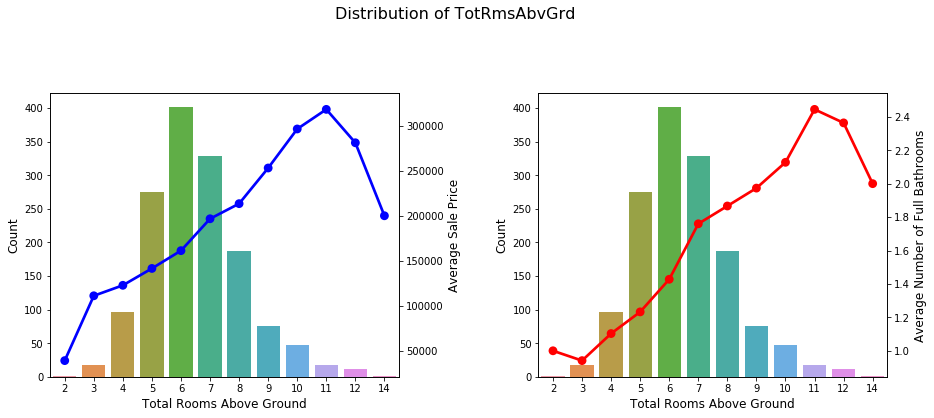

In [0]:
barChart1Data = train.loc[:, ['TotRmsAbvGrd', 'SalePrice', 'FullBath','YearBuilt']]
totalRooms = []
meanPriceSpecificRooms = []
meanBathSpecificRooms = []

for nosRooms in barChart1Data.TotRmsAbvGrd.unique():
  dataWithSpecificRooms = barChart1Data[barChart1Data['TotRmsAbvGrd'] == nosRooms]
  totalRooms.append(nosRooms)
  meanPriceSpecificRooms.append(dataWithSpecificRooms['SalePrice'].mean())
  meanBathSpecificRooms.append(dataWithSpecificRooms['FullBath'].mean())
  

 
  
barChart1Data1 = pd.DataFrame()
barChart1Data1['Rooms'] = totalRooms
barChart1Data1['AvgSalePrice'] = meanPriceSpecificRooms
barChart1Data1['AvgFullBath'] = meanBathSpecificRooms


plt.figure(figsize=(15,12))
plt.suptitle('Distribution of TotRmsAbvGrd', fontsize=16)
grid = plt.GridSpec(2, 2, wspace=0.4, hspace=0.3)


plt.subplot(grid[0, 0])
cp1 = sns.countplot(train.TotRmsAbvGrd)
lp1 = cp1.twinx()
lp1 = sns.pointplot(y="AvgSalePrice", x="Rooms", data=barChart1Data1, color="blue")
cp1.set_xlabel("Total Rooms Above Ground", fontsize=12)
cp1.set_ylabel("Count", fontsize=12)
lp1.set_ylabel("Average Sale Price", fontsize=12)

plt.subplot(grid[0, 1])
cp1 = sns.countplot(train.TotRmsAbvGrd)
lp1 = cp1.twinx()
lp1 = sns.pointplot(y="AvgFullBath", x="Rooms", data=barChart1Data1, color="red")
cp1.set_xlabel("Total Rooms Above Ground", fontsize=12)
cp1.set_ylabel("Count", fontsize=12)
lp1.set_ylabel("Average Number of Full Bathrooms", fontsize=12)




plt.show()





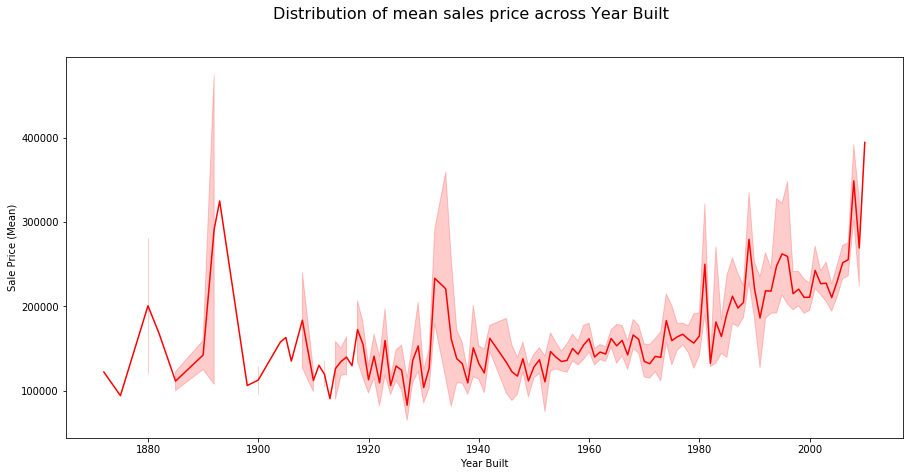

In [0]:
years = []
meanPriceYearBuilt = []

for year in barChart1Data.YearBuilt.unique():
  dataWithSpecificRooms = barChart1Data[barChart1Data['YearBuilt'] == year]
  years.append(year)
  meanPriceYearBuilt.append(dataWithSpecificRooms['SalePrice'].mean())


plt.figure(figsize=(15,7))
plt.suptitle('Distribution of mean sales price across Year Built', fontsize=16)
sns.lineplot(y='SalePrice', x='YearBuilt', data=train[['YearBuilt','SalePrice']], color='red')
plt.xlabel("Year Built")
plt.ylabel("Sale Price (Mean)")
plt.show()

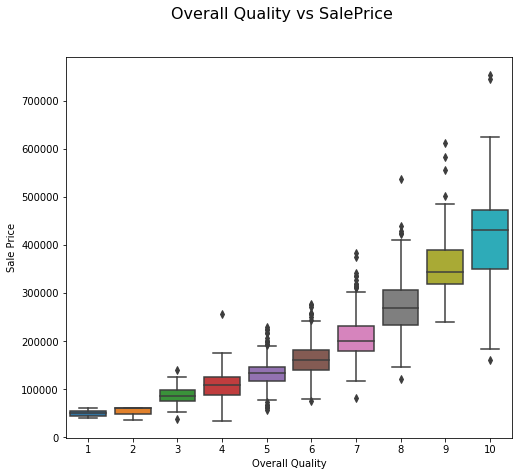

In [0]:
plt.figure(figsize=(8,7))
sns.boxplot(x='OverallQual', y='SalePrice', data=train[['SalePrice', 'OverallQual']])
plt.suptitle('Overall Quality vs SalePrice', fontsize=16)
plt.xlabel("Overall Quality")
plt.ylabel("Sale Price")
plt.show()

<Figure size 720x1440 with 0 Axes>

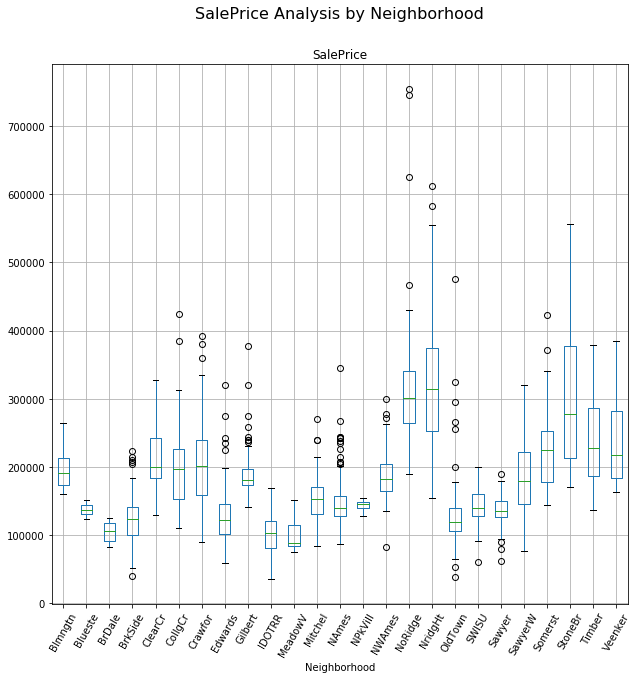

In [0]:
plt.figure(figsize=(10,20))
train.boxplot(by='Neighborhood', column=['SalePrice'],figsize = (10,10),rot = 60)
plt.suptitle('SalePrice Analysis by Neighborhood', fontsize=16)
plt.show()

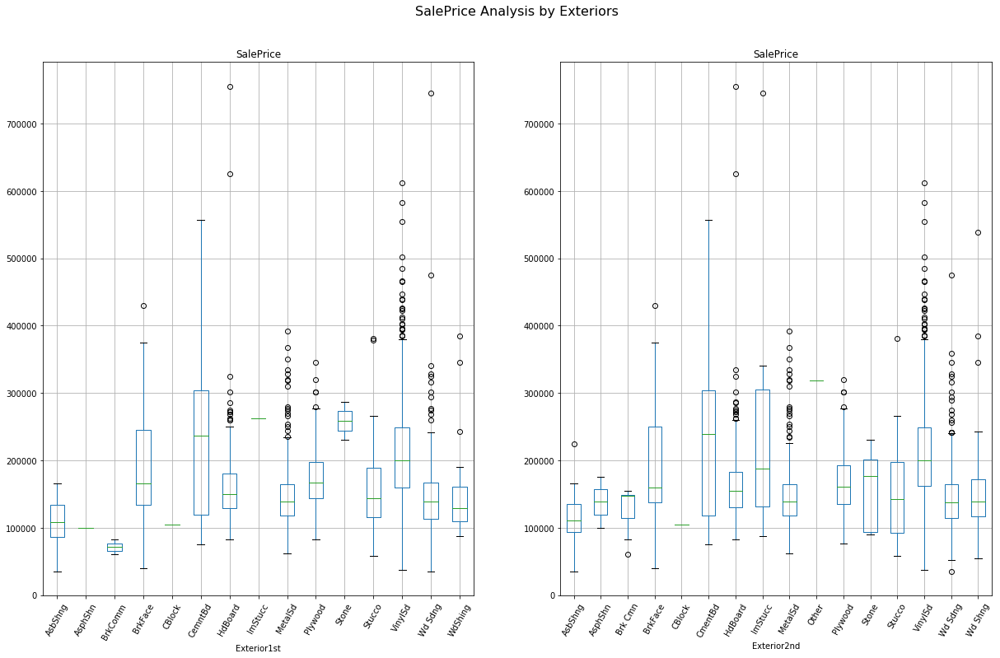

In [0]:
fig,axes = plt.subplots(ncols=2, figsize=(20, 12))
train.boxplot(by='Exterior1st', column=['SalePrice'],rot = 60,ax = axes[0])
train.boxplot(by='Exterior2nd', column=['SalePrice'],rot = 60,ax = axes[1])
plt.suptitle('SalePrice Analysis by Exteriors', fontsize=16)
plt.show()

Let's see the plots for all int64 fields (except ID)

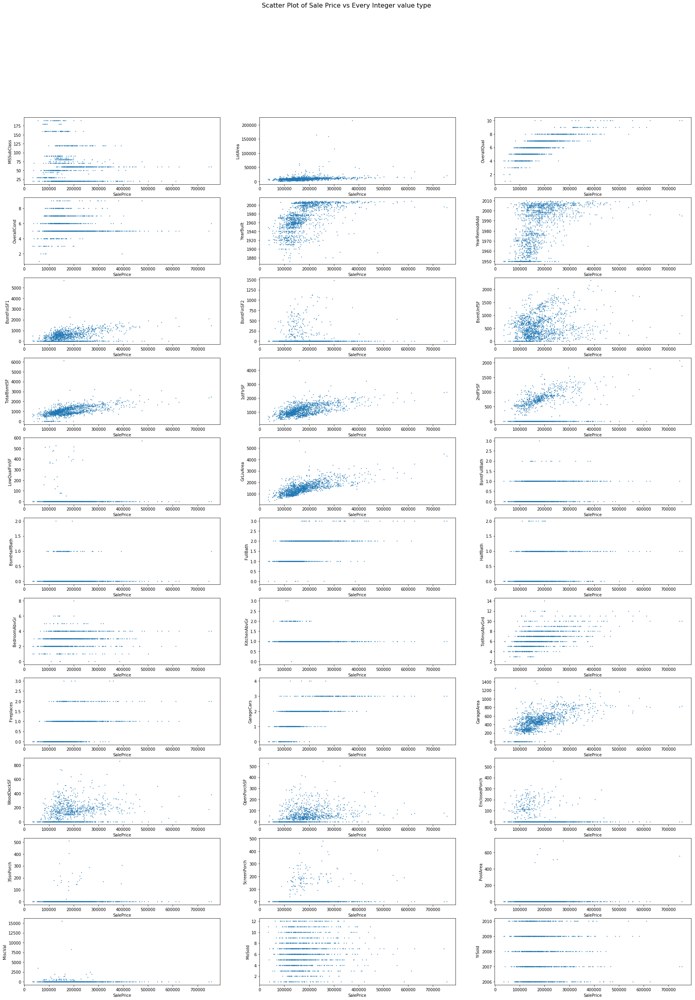

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3)

x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    x = x + 1
    
plt.suptitle('Scatter Plot of Sale Price vs Every Integer value type', fontsize=16)
plt.show()

Let's see which columns have categorical data. From the plots above, we see many columns of float64 having categorical data - **MSSubClass, OverallQuality, OverallCond, BsmtFullBath, BsmtHalfBath, HalfBath, FullBath, BedroomAbvGr, KitchenAbvGr,TotRmsAbvGr, Fireplaces, GarageCars, MoSold, YrSold**

Let's see the object datatypes - they are mainly string data. Let's see which ones are categorical.

In [0]:
for index in range(0,len(column_types_and_names["object"])):
  print ("Categories of Column - "+column_types_and_names["object"][index]+": \n")
  print (train.groupby(column_types_and_names["object"][index])['Id'].nunique())
  print("\n")

print ("Total number of rows in dataset- "+str(train.shape[0])+"\n")
print ("Percentage of missing values in each column - \n")

percent_missing = train.isnull().sum() * 100 / len(train)
missing_value_df = pd.DataFrame({'column_name': train.columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True,ascending = False)

print(missing_value_df)

Categories of Column - MSZoning: 

MSZoning
C (all)      10
FV           65
RH           16
RL         1151
RM          218
Name: Id, dtype: int64


Categories of Column - Street: 

Street
Grvl       6
Pave    1454
Name: Id, dtype: int64


Categories of Column - Alley: 

Alley
Grvl    50
Pave    41
Name: Id, dtype: int64


Categories of Column - LotShape: 

LotShape
IR1    484
IR2     41
IR3     10
Reg    925
Name: Id, dtype: int64


Categories of Column - LandContour: 

LandContour
Bnk      63
HLS      50
Low      36
Lvl    1311
Name: Id, dtype: int64


Categories of Column - Utilities: 

Utilities
AllPub    1459
NoSeWa       1
Name: Id, dtype: int64


Categories of Column - LotConfig: 

LotConfig
Corner      263
CulDSac      94
FR2          47
FR3           4
Inside     1052
Name: Id, dtype: int64


Categories of Column - LandSlope: 

LandSlope
Gtl    1382
Mod      65
Sev      13
Name: Id, dtype: int64


Categories of Column - Neighborhood: 

Neighborhood
Blmngtn     17
Blueste      

We are going to ignore the columns with more than 15% data in our ML model - later

In [0]:
gg = missing_value_df.loc[missing_value_df['percent_missing'] > 15]
ignore_columns_in_model = gg['column_name'].tolist()

print ("Columns we are definitely ignoring due to high missing values - "+str(ignore_columns_in_model))

Columns we are definitely ignoring due to high missing values - ['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'LotFrontage']


Let's prepare scatter charts with clusters based on each categorization of object columns

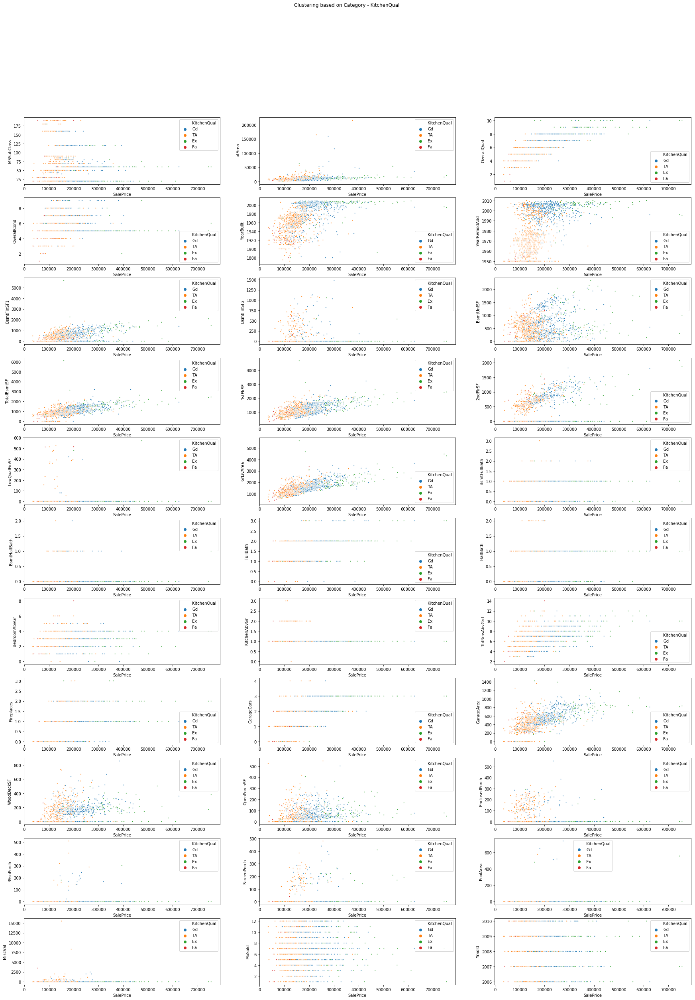

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[12],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

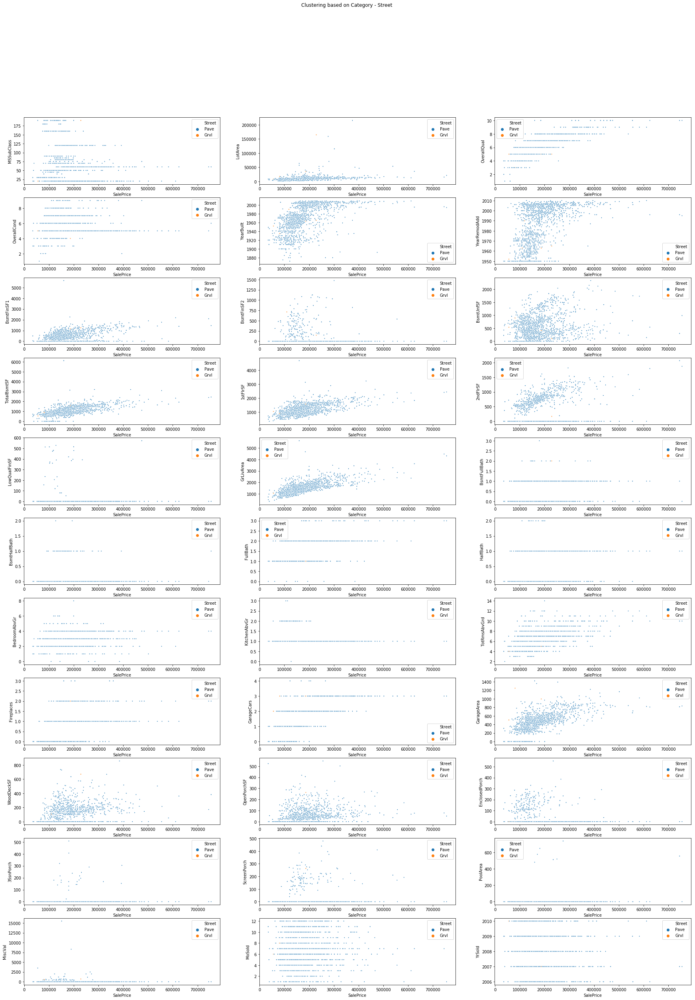

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[13],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

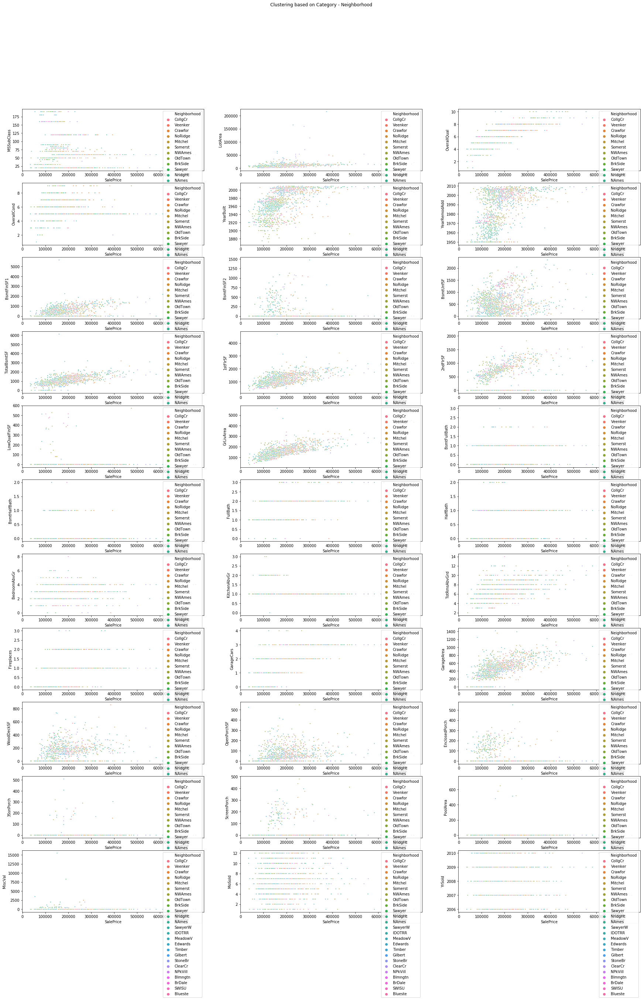

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[14],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

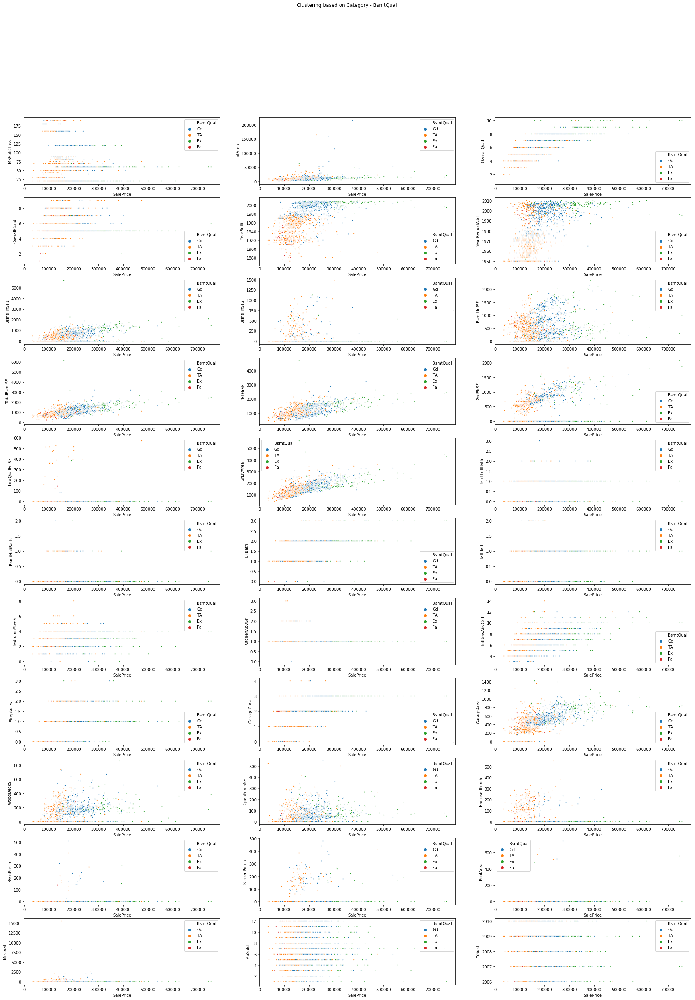

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[15],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

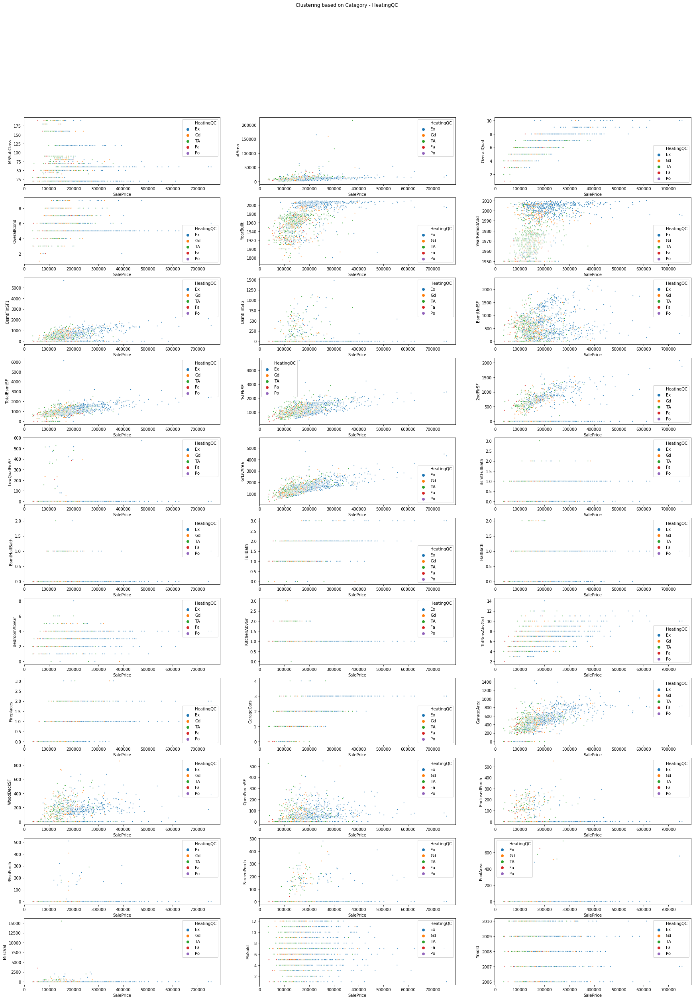

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[16],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

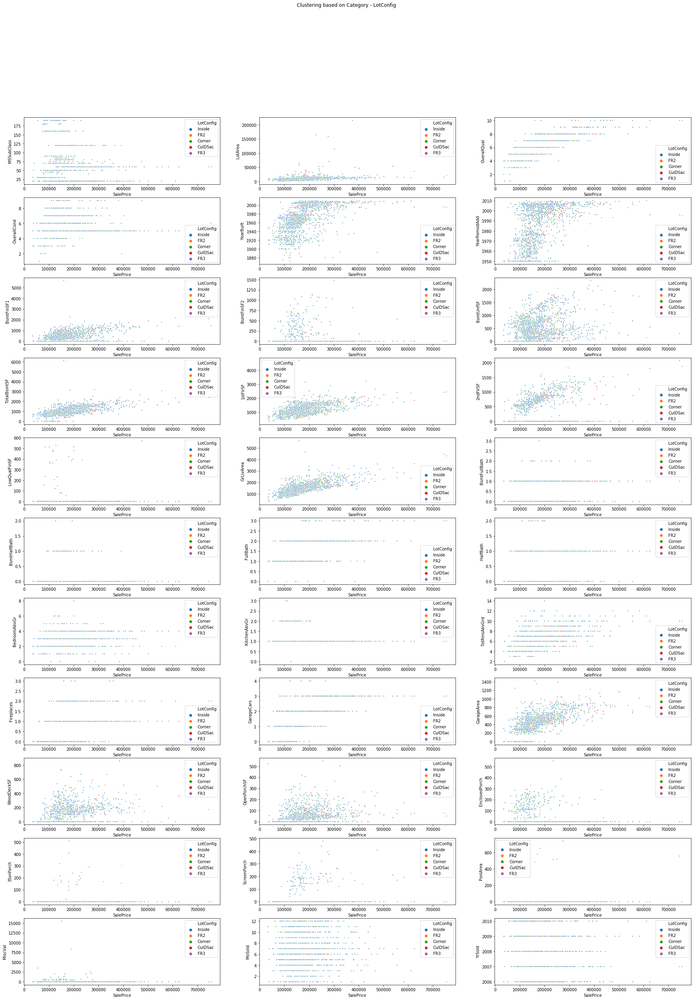

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[17],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

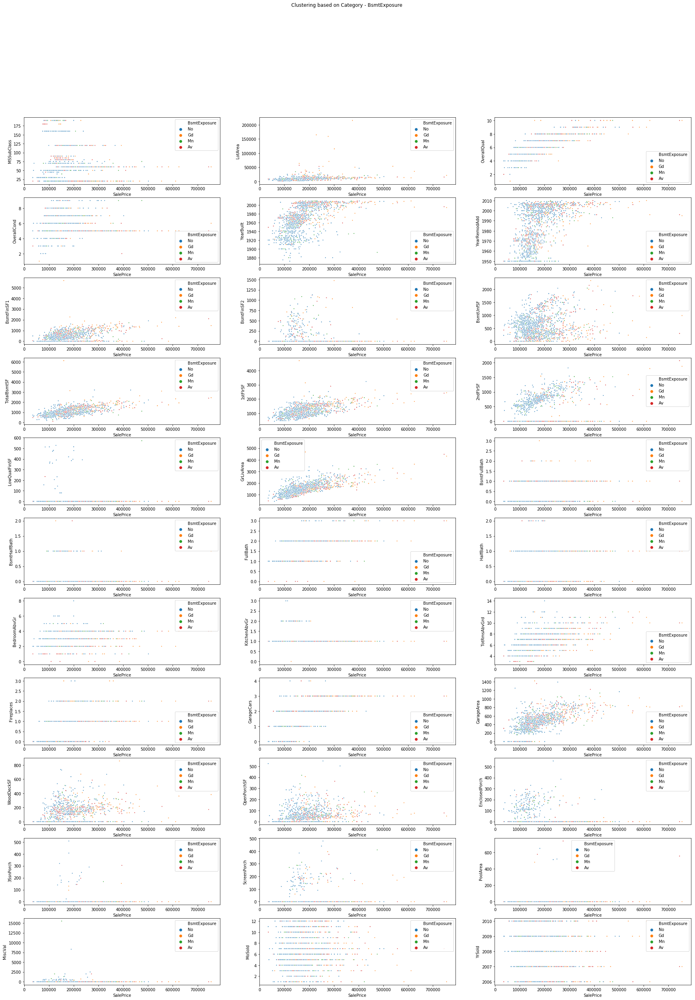

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[18],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

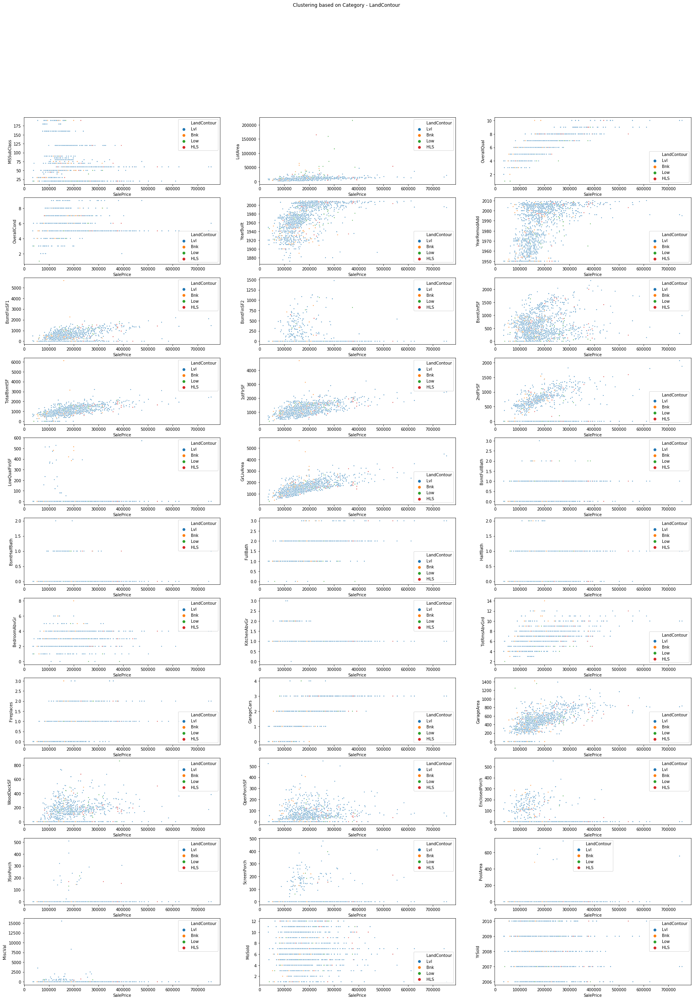

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[19],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

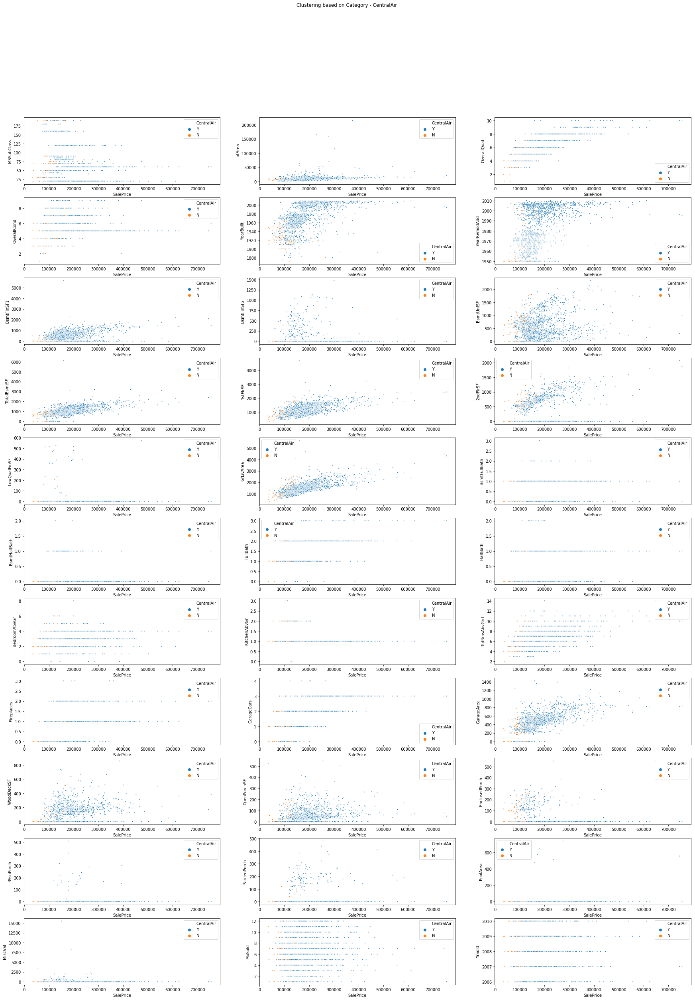

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[20],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

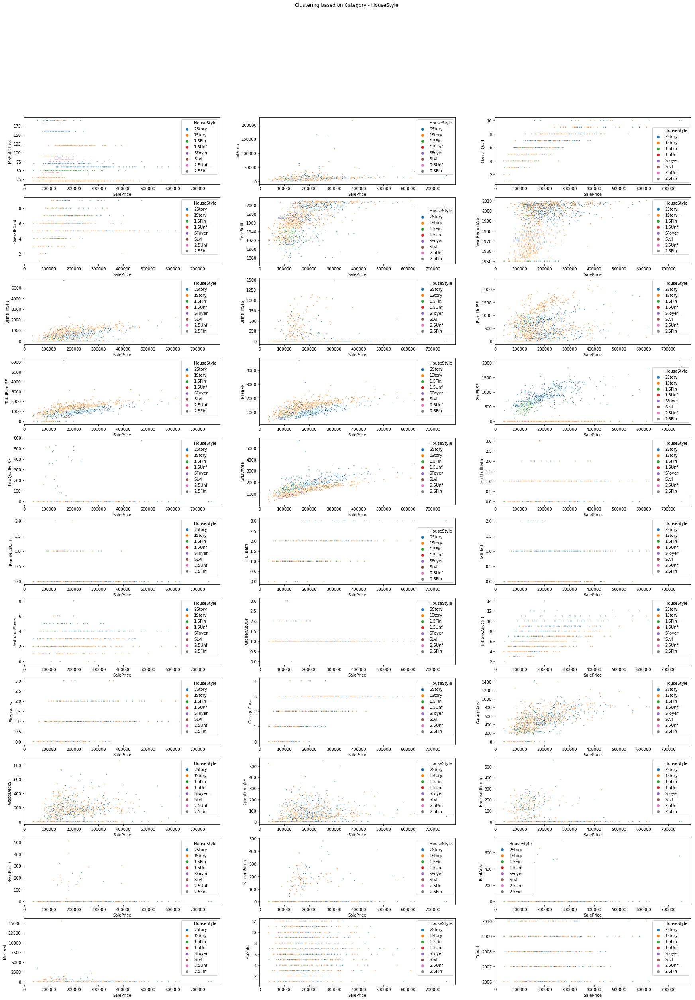

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[21],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

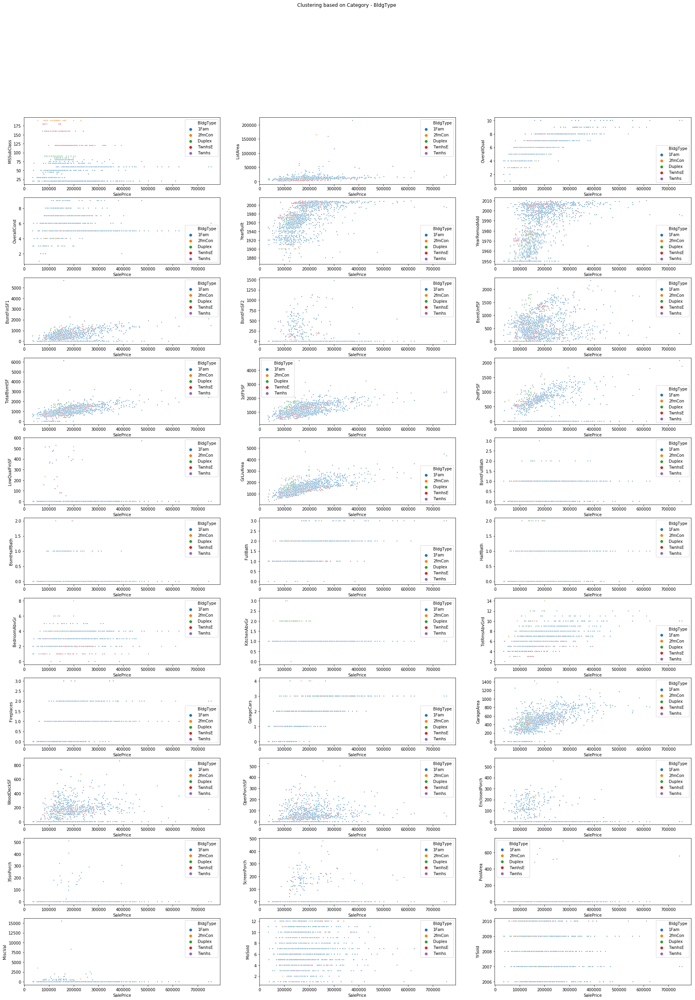

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[22],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

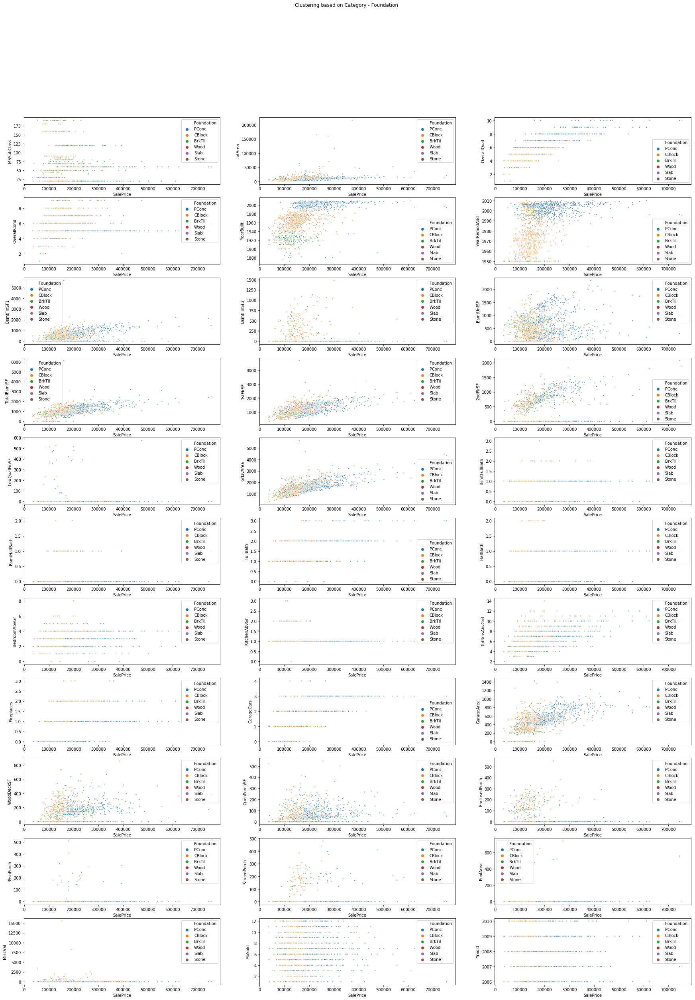

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[23],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

## One of the interesting insights we see is that newer houses have a Foundation built with concrete

## We see that if ExternalGA == TA, then prices are low

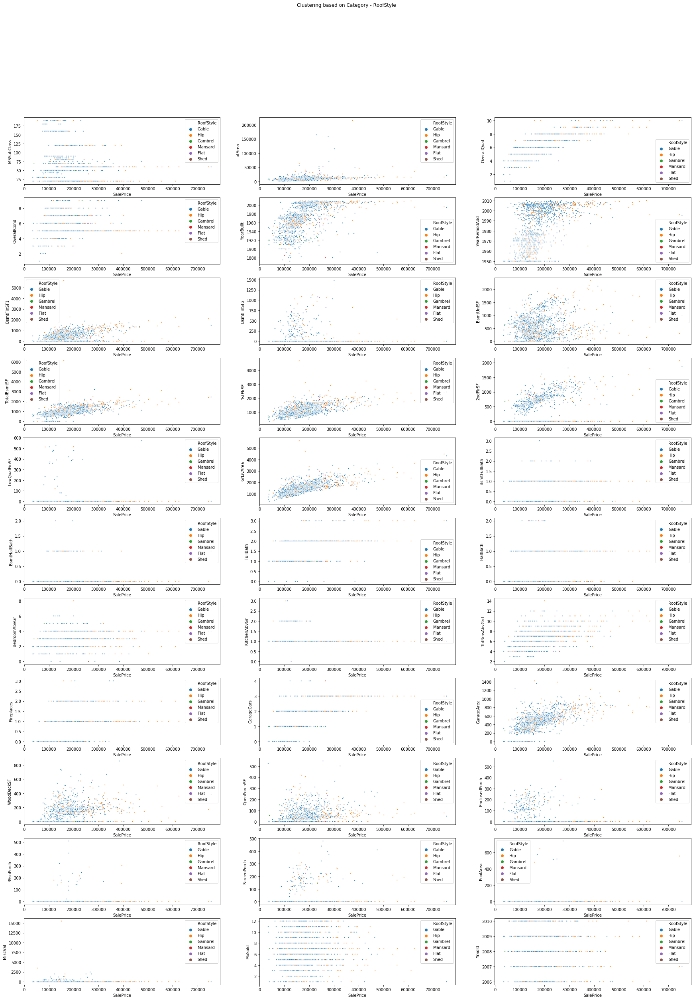

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[31],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

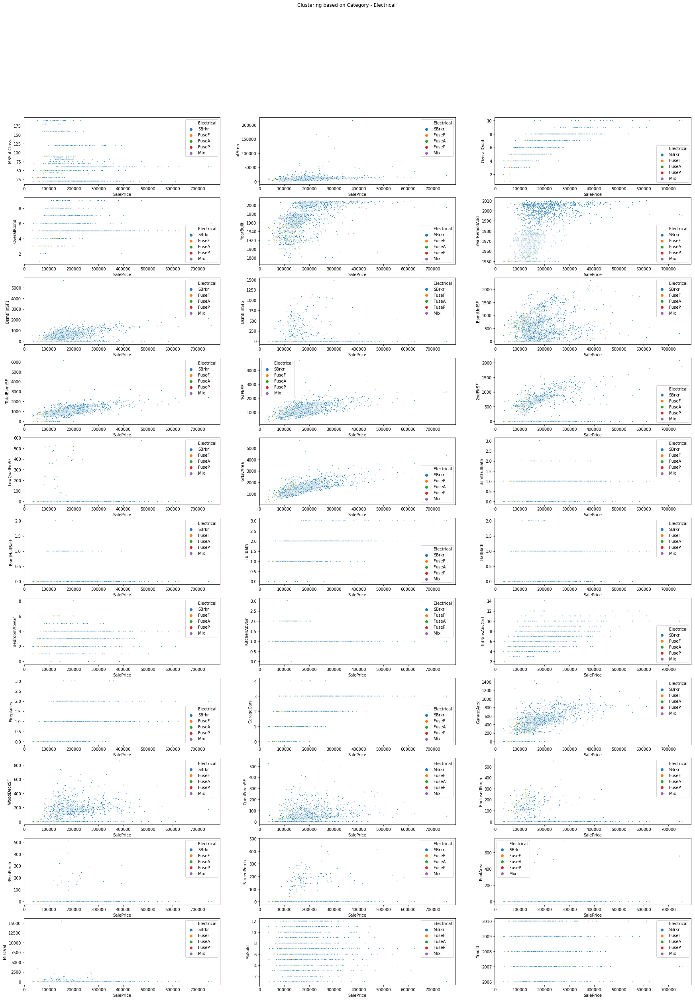

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[32],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

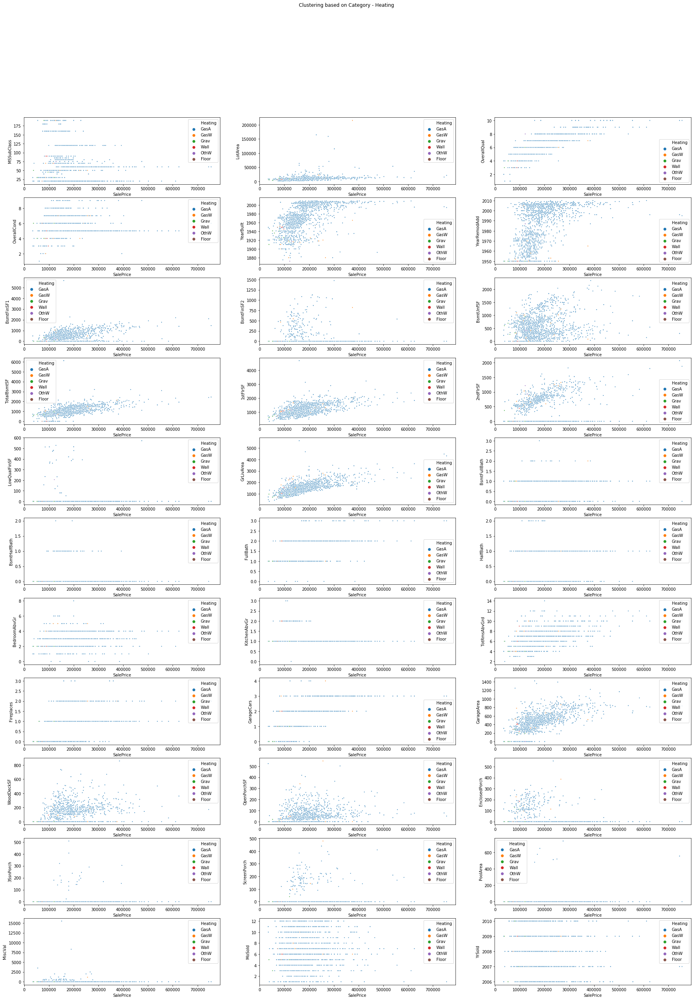

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[33],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

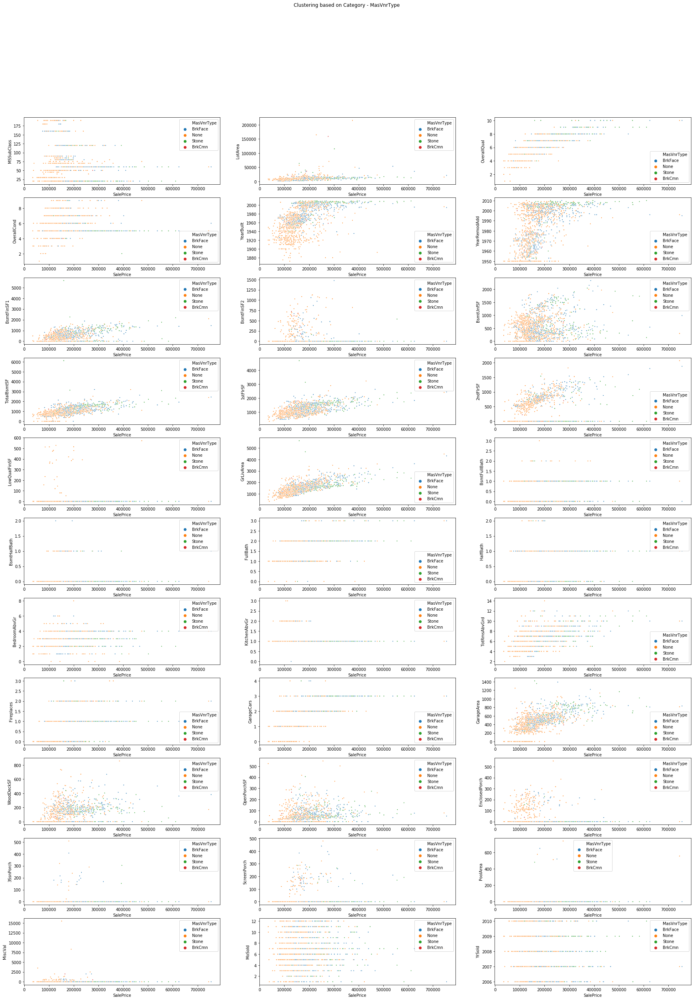

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[34],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

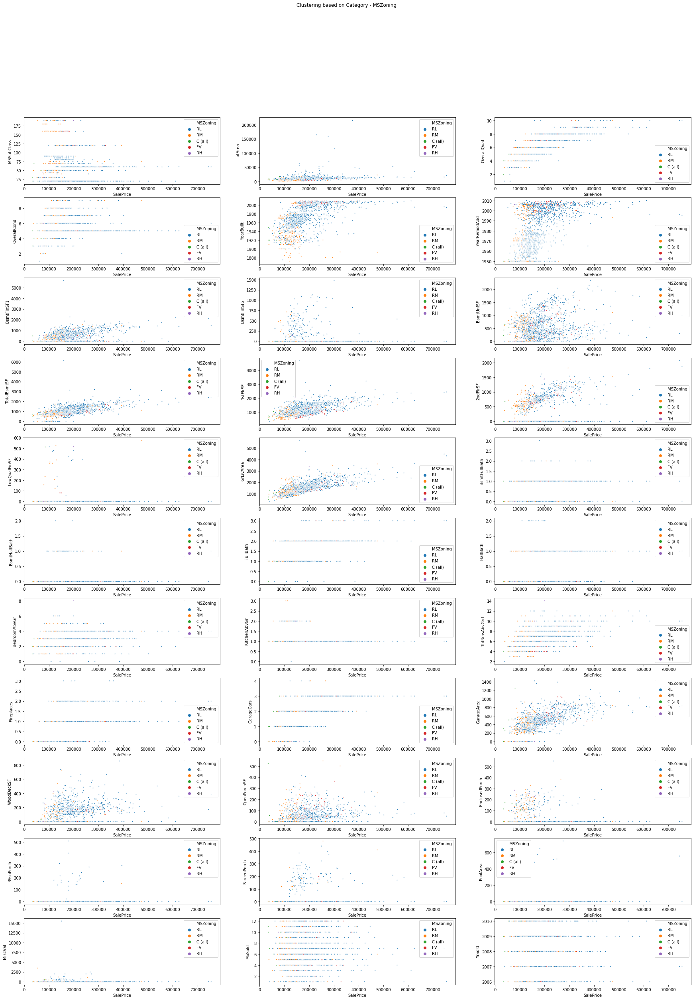

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[35],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

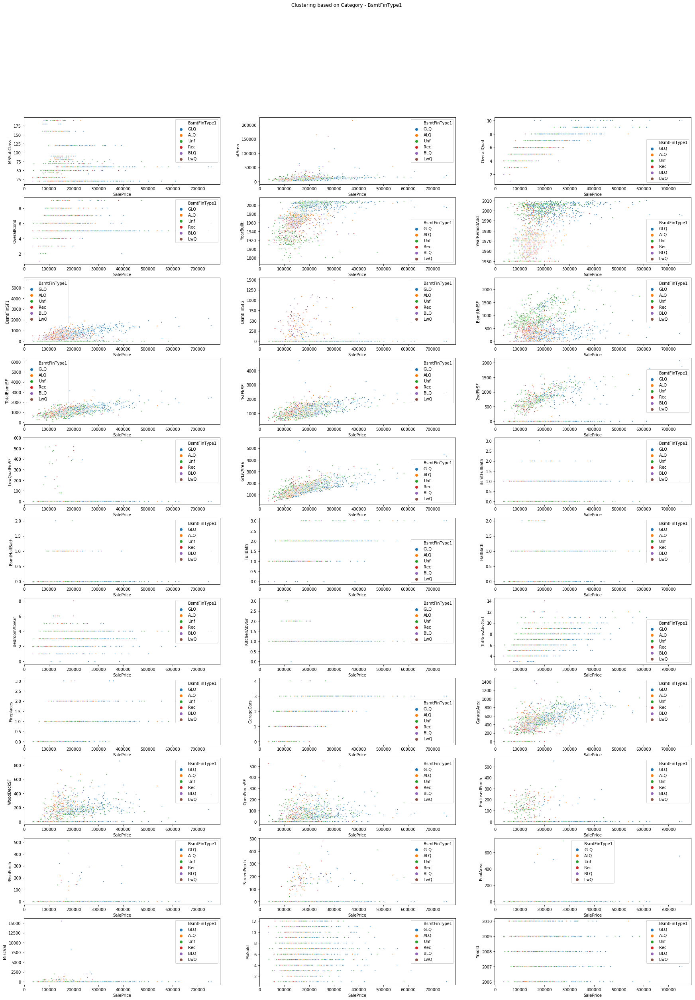

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[36],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

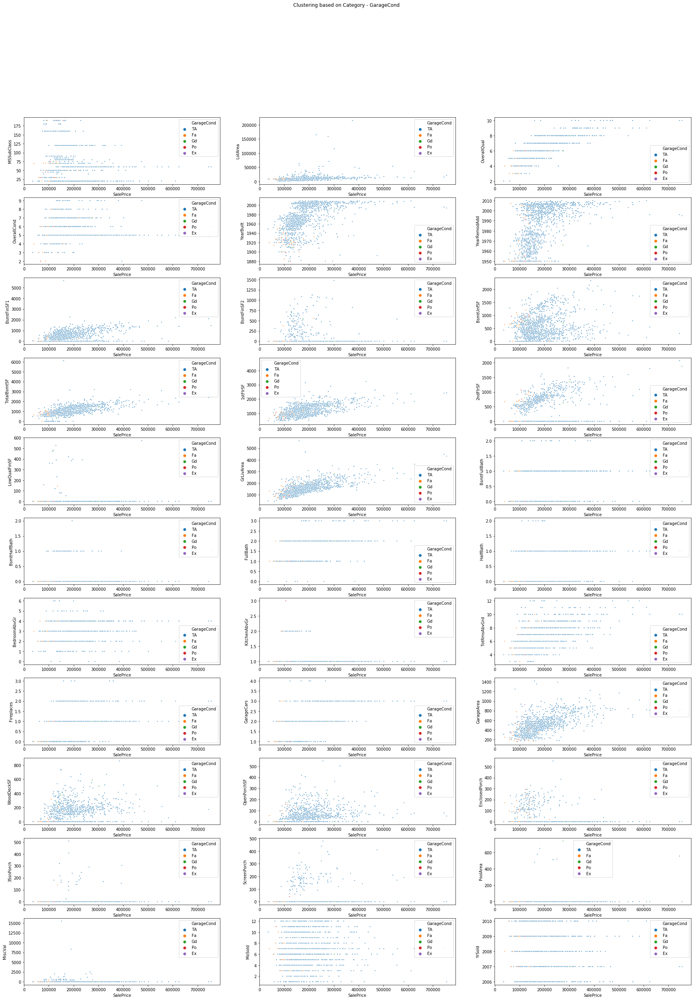

In [0]:
fig,ax1 = plt.subplots(math.ceil((len(column_types_and_names["int64"]) - 2)/3),3, figsize=(30, 40))


x = 0
for index in range(0,len(column_types_and_names["int64"])):
  if(column_types_and_names["int64"][index] != 'SalePrice' and column_types_and_names["int64"][index] != 'Id'):
    #train.plot(kind="scatter", x="SalePrice", y=column_types_and_names["int64"][index], ax=ax1[int(x / 3)][x % 3],figsize = (30,40), s = 1)
    sns.scatterplot(x="SalePrice", y=column_types_and_names["int64"][index],
              hue=columns_for_clusters[37],
              data=train, ax = ax1[int(x / 3)][x % 3],s = 7);
    x = x + 1
plt.suptitle("Clustering based on Category - "+columns_for_clusters[m])    
m = m + 1
plt.show()

## Part 9

Finally, build the best prediction model you can to solve the task.  Use any data, ideas, and approach that you like. Predict the pricing for instances at file “sample_submission.csv”. Report the score/rank you get.

We have categorical data in our dataset. So, we'll use One Hot Encoding


In [0]:
def drop_columns(dataframe,columns):
    temp_df = dataframe.copy()
    for column in columns:
        temp_df.drop(column, axis=1, inplace=True)
    return temp_df

def put_zero_for_filling(dataframe,columns):
    for column in columns:
        dataframe[column].fillna(0, inplace = True)

def put_default_string(dataframe, column, default_string):
    dataframe[column].fillna(default_string, inplace = True)

def replace_with_mean(dataframe, column):
    dataframe[[column]] = dataframe[[column]].fillna(value = dataframe[column].mean())
    
def data_fix(df1,df2):
    df1_rows = df1.shape[0]
    df2['SalePrice'] = -1
    full_df = pd.concat([df1,df2])
    for column_name in list(full_df.columns.values):
        if(full_df[column_name].dtype == np.object):
            '''One hot encoding'''
            full_df = pd.concat([full_df,pd.get_dummies(full_df[column_name],prefix = column_name)],axis = 1)
            full_df.drop([column_name], axis = 1, inplace = True)
    df1 = full_df[:df1_rows]
    df2 = full_df[df1_rows:]
    df2.drop('SalePrice', axis = 1, inplace = True)
    return df1,df2
  

def full_fledge_preprocess(dataframe,ignore_columns):
  processed_dataframe = drop_columns(dataframe,ignore_columns)
  categorical_columns = list(processed_dataframe.select_dtypes(include=['object']).columns)
  non_categorical_columns = list(processed_dataframe.select_dtypes(exclude=['object']).columns)
  for categorical_column in categorical_columns:
    put_default_string(processed_dataframe,categorical_column,'None Given')
  for non_categorical_column in non_categorical_columns:
    replace_with_mean(processed_dataframe,non_categorical_column)
  return processed_dataframe

ignore_columns_in_model.append('Id')
ignore_columns_in_model = list(set(ignore_columns_in_model))
train_cleaned_preprocessed = full_fledge_preprocess(train,ignore_columns_in_model)
test_clean_preprocessed = full_fledge_preprocess(test,ignore_columns_in_model)

train_cleaned_preprocessed,test_clean_processed = data_fix(train_cleaned_preprocessed,test_clean_preprocessed)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


Let's use XGBoost Model to predict the housing prices. Let's import the Scikit learn libraries and do a split on our processed data - 85% for training and 15% for testing

In [0]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_cleaned_preprocessed.loc[:,train_cleaned_preprocessed.columns != 'SalePrice'], train_cleaned_preprocessed['SalePrice'], test_size=0.15)



Let's use **XGBoost** for our model 

In [0]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

data_dmatrix = xgb.DMatrix(data = X_train, label = y_train)
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 150)

xg_reg.fit(X_train,y_train)
predict_test = xg_reg.predict(X_test)
print(mean_squared_error(y_test,predict_test.round()))

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[03:48:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
381012014.977169


In [0]:
final_predict = xg_reg.predict(test_clean_processed)
final_predict.round()

out = pd.DataFrame({'Id':test['Id'], 'SalePrice':final_predict[:]})
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import io

# Authenticate and create the PyDrive client.
# This only needs to be done once in a notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Create & upload a text file.
s = io.StringIO()
out.to_csv(s)
uploaded = drive.CreateFile({'title': 'sample_submission.csv'})
uploaded.SetContentString(s.getvalue())
uploaded.Upload()
print('Uploaded file with ID {}'.format(uploaded.get('id')))

Uploaded file with ID 1WTYrAEeJAbR6KmwgX9o1_c5Y3dXXkUyB


**Part 10**

Submit your results on Kaggle. Write the result into a csv file and submit it to the website. You should do this for every model you develop. Report the rank, score, number of entries, for your highest rank. Include a snapshot of your best score on the leaderboard as confirmation. Be sure to provide a link to your Kaggle profile. 

The results are as follows - 

Score - 0.12870

Rank - 1739

Screenshot 

![alt text](https://imgur.com/download/oWacpQt)

Link - 

[Profile Link](https://kaggle.com/prateeknarsbu)

# Part 6

Set up a simple linear regression model on one or more variables to predict the pricing as a function of other variables. How well/badly does it work? Which variable is the most important one? 

For linear Regression, we'll use the libraries from Scikit Learn. I am using the data that has been processed as part of Part 9

To see how we'll or badly the model has performed, we'll check the mean absolute error

In [0]:
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
cols = train_cleaned_preprocessed.columns


train_cleaned_preprocessed_normalize = preprocessing.normalize(train_cleaned_preprocessed)
train_cleaned_preprocessed_normalize = pd.DataFrame(train_cleaned_preprocessed_normalize,columns = cols)

cols = set(cols)
cols.remove('SalePrice')
cols = list(cols)

X_train, X_test, y_train, y_test = train_test_split(train_cleaned_preprocessed_normalize.loc[:,train_cleaned_preprocessed_normalize.columns != 'SalePrice'], train_cleaned_preprocessed_normalize['SalePrice'], test_size=0.15)

linearRegressor = LinearRegression()

linearRegressor.fit(X_train, y_train)
'''I have already created the dataset for training and testing as part of Part 9 whose code is before this part'''

y_predict = linearRegressor.predict(X_test)


print("The Mean Absolute Error - "+str((mean_absolute_error(y_test, y_predict))))

The Mean Absolute Error - 0.00241121904482867


Let's see the importances of the features. By seeing the coefficients after normalization and training, we can have a look. If no normalization is done, then we'll get a skewing of data.



In [0]:

#coefficients = pd.concat([pd.DataFrame(X_train.columns),pd.DataFrame(np.transpose(linearRegressor.coef_))], axis = 1)
#coefficients.columns = ['Column Name','Coefficient']
#coefficients.reindex(coefficients.Coefficient.abs().sort_values(ascending = False).index)


xg_reg.feature_importances_
coefficients = pd.concat([pd.DataFrame(X_train.columns),pd.DataFrame(np.transpose(xg_reg.feature_importances_))], axis = 1)
coefficients.columns = ['Column Name','Coefficient']
coefficients.reindex(coefficients.Coefficient.abs().sort_values(ascending = False).index)

,Column Name,Coefficient
169,ExterQual_Ex,0.282595
184,BsmtQual_Ex,0.157356
232,KitchenQual_Ex,0.057178
2,OverallQual,0.052811
236,KitchenQual_TA,0.050779
24,GarageCars,0.042895
14,GrLivArea,0.031680
180,Foundation_PConc,0.026841
172,ExterQual_TA,0.021341
23,GarageYrBlt,0.019681


So, from above we see the most important affecting factors are  - 

*   SaleCondition
*   YearBuilt
*   GrLivingArea
*   GarageArea
*   YearBuilt
*   OverallQuality

# Part 8

For ten different variables (some likely good, some likely meaningless) from the data set, build single-variable regression models, and for each one do a permutation test to determine a p-value of how good your predictions of the housing prices are.  Use root-mean-squared error of the log(price) to score your model.   In other words, compare how your model ranks by this metric on the real data compared to 100 (or more) random permutations of the housing priced assigned to the real data records.

Let's take **OverallQual, GrLivingArea, LotFrontage, YearBuilt, TotalBsmtSF, GarageArea, WoodDeckSF, LoatArea, GarageCars, OpenDeckSF** vs Sale Price



In [0]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import permutation_test_score

rms = pd.DataFrame(columns = ['Column','RMS of Log(Price)'])
pscore = pd.DataFrame(columns = ['Column','Score','Permutation Scores', 'p-Value'])


dataframe1 = train[['OverallQual','SalePrice']]
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)

data = {'Column':'OverallQual','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[9] = [data['Column'], data['RMS of Log(Price)']]

score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'OverallQual','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[9] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]



dataframe1 = train[['GrLivArea','SalePrice']]
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'GrLivArea','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[0] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'GrLivArea','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[0] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]


dataframe1 = train[['LotFrontage','SalePrice']]
replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'LotFrontage','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[1] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'LotFrontage','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[1] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]

dataframe1 = train[['YearBuilt','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'YearBuilt','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[2] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'YearBuilt','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[2] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]



dataframe1 = train[['TotalBsmtSF','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'TotalBsmtSF','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[3] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'TotalBsmtSF','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[3] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]


dataframe1 = train[['GarageArea','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'GarageArea','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[4] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'GarageArea','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[4] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]

dataframe1 = train[['WoodDeckSF','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'WoodDeckSF','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[5] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'WoodDeckSF','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[5] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]



dataframe1 = train[['LotArea','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)

data = {'Column':'LotArea','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[6] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'LotArea','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[6] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]


dataframe1 = train[['GarageCars','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'GarageCars','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[7] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'GarageCars','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[7] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]

dataframe1 = train[['OpenPorchSF','SalePrice']]
#replace_with_mean(dataframe1,'LotFrontage')
dataframe1['SalePrice'] = np.log(dataframe1['SalePrice']) 

linearRegressor = LinearRegression()

X1_train, X1_test, y1_train, y1_test = train_test_split(dataframe1.loc[:,dataframe1.columns != 'SalePrice'], dataframe1['SalePrice'], test_size=0.15)

linearRegressor.fit(X1_train, y1_train)

y1_predict = linearRegressor.predict(X1_test)
data = {'Column':'OpenPorchSF','RMS of Log(Price)':math.sqrt(mean_squared_error(y1_test, y1_predict))}
rms.loc[8] = [data['Column'], data['RMS of Log(Price)']]
score, permutation_scores, pvalue = permutation_test_score(linearRegressor, X1_train, y1_train, n_permutations=100, n_jobs=1)
data2 = {'Column':'OpenPorchSF','Score':score,'Permutation Scores':permutation_scores,'p-Value':pvalue}
pscore.loc[8] = [data2['Column'], data2['Score'],data2['Permutation Scores'], data2['p-Value']]


rms.head(10)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python3.6/dist-packages/sklearn/mode

,Column,RMS of Log(Price)
9,OverallQual,0.233506
0,GrLivArea,0.292670
1,LotFrontage,0.401563
2,YearBuilt,0.321793
3,TotalBsmtSF,0.306795
4,GarageArea,0.325337
5,WoodDeckSF,0.380271
6,LotArea,0.378910
7,GarageCars,0.298910
8,OpenPorchSF,0.378818


In [0]:
pscore.loc[:,pscore.columns != 'Permutation Scores'].head(10)

,Column,Score,p-Value
9,OverallQual,0.667567,0.009901
0,GrLivArea,0.480364,0.009901
1,LotFrontage,0.118186,0.009901
2,YearBuilt,0.330960,0.009901
3,TotalBsmtSF,0.367412,0.009901
4,GarageArea,0.431353,0.009901
5,WoodDeckSF,0.112516,0.009901
6,LotArea,0.055879,0.009901
7,GarageCars,0.460651,0.009901
8,OpenPorchSF,0.100972,0.009901


p-Value is very low. So, the models are good

# Part 7

Identify at least one external data set which you can integrate into your price prediction analysis to make it better. Write a discussion/analysis on whether this data helps with the prediction tasks.

One of the interesting datasets I found was [Ames Housing Price Index](https://fred.stlouisfed.org/series/ATNHPIUS11180Q). This dataset has an Index that can account for inflation of house prices over time. This normalizes the sale price over multiple years.

# Part 4

Define a house “pairwise distance function”, which measures the similarity of two properties.  Like a distance metric, similar pairs of very similar properties should be distance near zero, with distance increasing as the properties grow more dissimilar.  Experiment with your distance function, and write a discussion evaluating how well you think it worked.   When did it do well and when badly?



We'll make an Euclidian Distance Formula

In [0]:
def euclidean_distance(entry1, entry2,cols):
    #return sum((p-q)**2 for p, q in zip(entry1, entry2)) ** .5
    sum = 0
    for column in cols:
      sum = sum + (entry1[column] - entry2[column])**2
    sum = sum ** 0.5
    return sum

def euclidean_distance_array(entry1, entry2, cols):
  distance_array = []
  for column in cols:
    distance_array.append(euclidean_distance(entry1, entry2, [column]))
  return distance_array
  
train_cleaned_preprocessed_normalize.loc[0][train_cleaned_preprocessed_normalize.columns != 'SalePrice']
colss = train_cleaned_preprocessed_normalize.columns 
colss = set(colss)
colss.remove('SalePrice')
colss = list(colss)

print('Euclidian Distance between Entry 0 and Entry 1 (all points combined) is - ' + str(euclidean_distance(train_cleaned_preprocessed_normalize.loc[0],train_cleaned_preprocessed_normalize.loc[1],colss)))
print('Euclidian Distance between Entry 0 and Entry 1 (all points separate) is - ' + str(euclidean_distance_array(train_cleaned_preprocessed_normalize.loc[0],train_cleaned_preprocessed_normalize.loc[1],colss)))








Euclidian Distance between Entry 0 and Entry 1 (all points combined) is - 0.014191899697478961
Euclidian Distance between Entry 0 and Entry 1 (all points separate) is - [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.091157505422522e-07, 0.0, 0.0, 0.0, 0.001271855291865626, 7.091157505422522e-07, 2.0045973916100634e-05, 0.0, 4.79101597058754e-06, 7.091157505422522e-07, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0009390391302351579, 7.091157505422522e-07, 0.0, 0.0, 0.0, 0.0, 5.500131721129792e-06, 0.0, 0.0, 1.791862666447388e-05, 0.0, 0.0, 0.0, 0.0, 7.091157505422522e-07, 0.0028400565612428635, 0.0, 0.0, 7.091157505422522e-07, 4.79101597058754e-06, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.500131721129792e-06, 4.79101597058754e-06, 0.0, 0.0, 0.0, 4.79101597058754e-06, 5.32733743792157e-06, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.091157505422522e-07, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00029225197420583996, 0.0, 0.0, 0.001271855291865626, 2.127347251626754e-06, 0.0, 0.0, 0.0, 0.0,

###On repeated experiments, we see that calculating Euclidean distance after normalization works better. But the scale gets very small. While it works fine for algorithms and code, the visualizations for this become hard.###



# Part 5

Using your distance function and an appropriate clustering algorithm, cluster the houses using your distance function into 5 to 20 classes, as you see best. Present a visualization illustrating the clusters your method produced.   How well do your clusters reflect neighborhood boundaries? (do not use neighborhood in your distance function)  Write a discussion/analysis of what your clusters seem to be capturing, and how well they work.


To do this - 
We'll reduce the dimensions of distances of each point from every other based on every column type except SalePrice and then cluster them. We'll use PCA Anaysis for Dimensionality Reduction and Cosine Distance for calculating the similarity between the dimensionally reduced dataset  

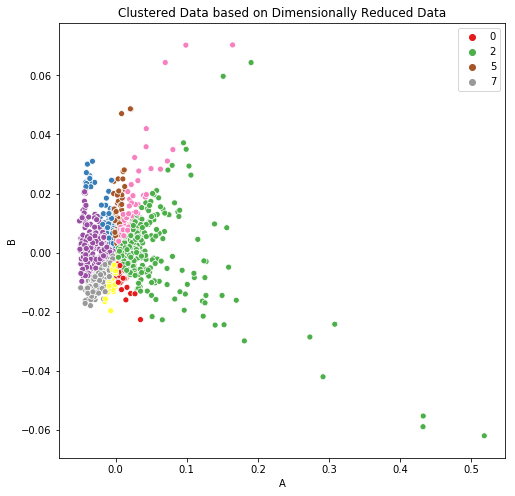

In [0]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

dimension_reduced_data = train_cleaned_preprocessed_normalize.loc[:,train_cleaned_preprocessed_normalize.columns!= 'SalePrice']
principalComponents = pca.fit_transform(dimension_reduced_data)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['A', 'B'])

clustering = AgglomerativeClustering(n_clusters=8, affinity='cosine', linkage = 'complete').fit(principalDf)
clusters = clustering.fit_predict(principalDf)

fig, ax = plt.subplots(figsize=(8,8))
sns.scatterplot(x='A', y='B', hue=clusters, data = principalDf ,ax=ax, palette="Set1")
plt.title('Clustered Data based on Dimensionally Reduced Data')
plt.show()


# Part 3

Build a handcrafted scoring function to rank houses by “desirability”, presumably a notion related to cost or value.  Identify what the ten most desirable and least desirable houses in the Kaggle data set are, and write a description of which variables your function used and how well you think it worked.

To build desirability , we'll normalize the data and add all scores. The one with higher score is ranked higher

##These are the top houses - 



In [0]:
scores = train_cleaned_preprocessed_normalize.transpose().sum()

top_houses = scores.sort_values(ascending = False).head(10)
top_houses2 = pd.DataFrame(top_houses,columns = ['Desirability'])
top_houses2['Id'] = top_houses.index+1


top_houses2.head()




,Desirability,Id
495,1.505990,496
1298,1.498349,1299
916,1.485980,917
30,1.479532,31
335,1.454473,336


## These are the bottom houses

In [0]:
bottom_houses = scores.sort_values(ascending = True).head(10)
bottom_houses2 = pd.DataFrame(bottom_houses,columns = ['Desirability'])
bottom_houses2['Id'] = bottom_houses.index+1

bottom_houses2.head()



,Desirability,Id
898,1.052175,899
1182,1.052230,1183
1181,1.054212,1182
803,1.056313,804
688,1.057342,689
